In [1]:
import os
import pathlib

In [2]:
root = pathlib.Path.cwd()

models_dir = pathlib.Path.cwd().parent / "models"
if not models_dir.exists():
    print("Models not found. Cloning from github to", models_dir)
    ! git clone --depth 1 https://github.com/tensorflow/models {cwd.absolute()}
else:
    print("Found models at", models_dir)



Found models at /home/addy/tensorflow/models


In [3]:
# If protoc is not installed, run this command on terminal with sudo to install
# ! apt install -y protobuf-compiler  

! protoc --version  # Ensure compiler version is 3+

libprotoc 3.6.1


In [4]:
# Install the Object Detection API
# research_dir = ({models_dir.absolute()}/'research').absolute()
# ! protoc {research_dir}/object_detection/protos/*.proto --python_out=.
# ! cp {research_dir}/object_detection/packages/tf2/setup.py .
# ! python -m pip install {research_dir}



In [5]:


import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import glob
import scipy.misc
import numpy as np
import pandas as pd
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline



In [6]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """
  Wrapper function to visualize detections.
  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.numpy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)



In [7]:
train_df = pd.read_pickle(root / 'intermedia' / 'train_df.pkl')
test_df = pd.read_pickle(root / 'intermedia' / 'test_df.pkl')

In [8]:
row = train_df[train_df.annotations_num > 5].sample(5)
row

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,is_annotated,annotations_num,annotations_np,image_path
12641,1,60754,9076,660,1-9076,"[{'x': 507, 'y': 549, 'width': 28, 'height': 3...",1,7,"[[507, 549, 28, 30], [618, 127, 34, 27], [838,...",/home/addy/tensorflow/datasets/202201-gbr/trai...
10612,1,8503,5460,1632,1-5460,"[{'x': 440, 'y': 186, 'width': 43, 'height': 3...",1,6,"[[440, 186, 43, 34], [251, 442, 49, 53], [379,...",/home/addy/tensorflow/datasets/202201-gbr/trai...
19730,2,22643,5828,465,2-5828,"[{'x': 968, 'y': 289, 'width': 67, 'height': 5...",1,9,"[[968, 289, 67, 54], [1161, 354, 75, 71], [215...",/home/addy/tensorflow/datasets/202201-gbr/trai...
10661,1,8503,5509,1681,1-5509,"[{'x': 352, 'y': 623, 'width': 60, 'height': 6...",1,9,"[[352, 623, 60, 62], [384, 481, 57, 58], [309,...",/home/addy/tensorflow/datasets/202201-gbr/trai...
10614,1,8503,5462,1634,1-5462,"[{'x': 433, 'y': 220, 'width': 43, 'height': 3...",1,7,"[[433, 220, 43, 34], [240, 480, 51, 58], [371,...",/home/addy/tensorflow/datasets/202201-gbr/trai...


In [9]:
train_seq = [53708, 60754]
val_seq = [40258]

width = 1280
height = 720

dividing_factor = np.array([width, height, width, height])

In [11]:
def getAnnotatedData(dataframe):
    images = dataframe.apply(lambda x: str(x.image_path), axis=1).to_list()

    def convertToFractions(row):

        res = []
        for i in row.annotations_np:
            x = i[0]
            y = i[1]
            w = i[2]
            h = i[3]
            v = np.array([y/height, x/width, (y+h)/height, (w+x)/width], np.float32)
            res.append(v)
        
        return np.array(res)
        
    annotations = dataframe.apply(convertToFractions, axis=1).to_list()
    classnames = dataframe.apply(lambda x:[[1.]]*len(x.annotations_np), axis=1).to_list()

    annotations = tf.cast(tf.ragged.constant(annotations), tf.float32)
    classnames = tf.cast(tf.ragged.constant(classnames), tf.float32)
    images = tf.constant(images)
    return images, annotations, classnames

temp = train_df[(train_df.sequence.isin(train_seq))].sample(5)
# temp = train_df[(train_df.annotations_num > 3)].sample(5)

train_x, train_y, train_classnames = getAnnotatedData(temp)

temp = train_df[(train_df.sequence.isin(val_seq))].sample(5)
# temp = train_df[(train_df.annotations_num > 3)].sample(2)
val_x, val_y, val_classnames = getAnnotatedData(temp)


In [12]:
# This works but setting 
# train_classnames = tf.ragged.constant(classnames_train, ragged_rank=1)
# ^ Doesnt work. Why?

def setLastDimensionShape(t, d):
    s = t.shape
    s = s.as_list()
    s[-1] = d
    t._set_shape(s)

# setLastDimensionShape(train_y, 4)
# setLastDimensionShape(train_classnames, 1)

In [13]:
train_x.shape, train_y.shape, train_classnames.shape

(TensorShape([5]), TensorShape([5, None, None]), TensorShape([5, None, None]))

In [14]:
val_x.shape, val_y.shape, val_classnames.shape

(TensorShape([5]), TensorShape([5, None, None]), TensorShape([5, None, None]))

In [15]:
AUTOTUNE = tf.data.AUTOTUNE

def process_path(file_path, label, classnames):
  raw = tf.io.read_file(file_path)
  image = tf.image.decode_png(raw, channels=3)
  image = tf.cast(image, tf.float32)
  # image = tf.expand_dims(image, axis=0)
  # classnames = tf.ones(tf.shape(label))
  # classnames = tf.ones_like(label)
  # classnames = tf.ones_like(tf.squeeze(label, [-1]))

  return image, label, classnames


train_dataset = tf.data.Dataset.from_tensor_slices((train_x, train_y, train_classnames)).map(process_path, num_parallel_calls=AUTOTUNE).batch(4)
val_dataset = tf.data.Dataset.from_tensor_slices((val_x, val_y, val_classnames)).map(process_path, num_parallel_calls=AUTOTUNE).batch(4)

(4, 720, 1280, 3) (4, None, None) (4, None, None)
0
<dtype: 'float32'>
(720, 1280, 3) None


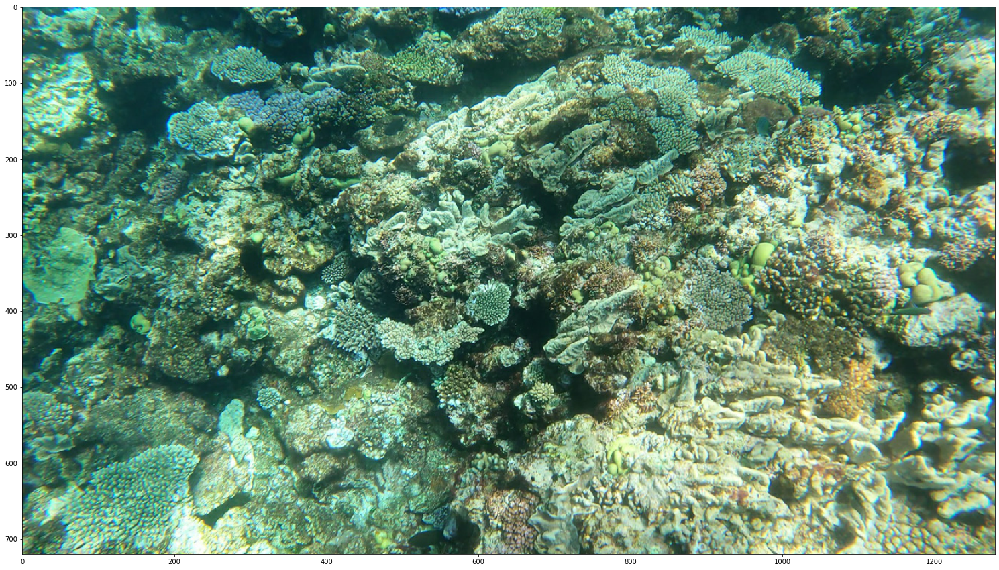

0
<dtype: 'float32'>
(720, 1280, 3) None


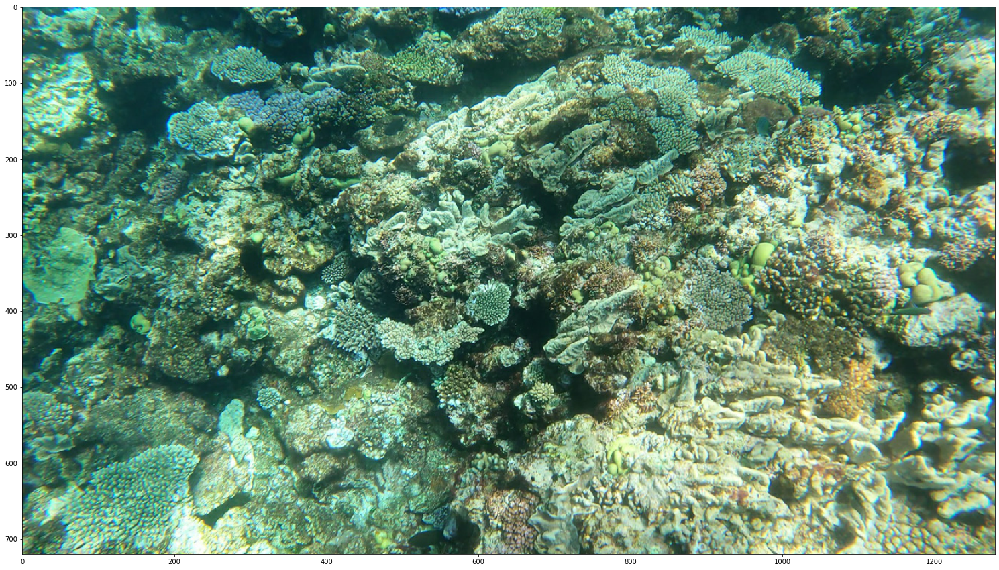

2
<dtype: 'float32'>
(720, 1280, 3) None


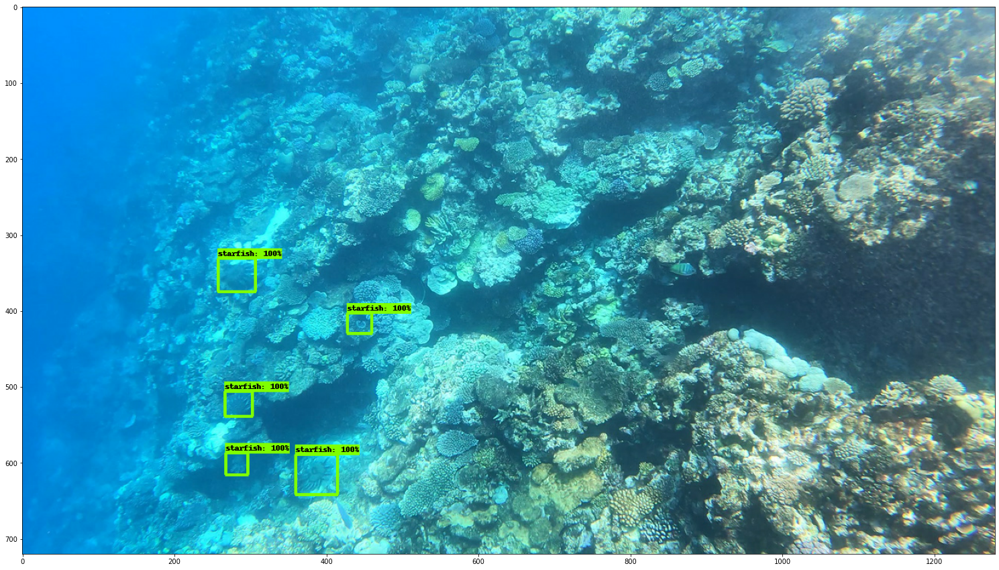

In [16]:

starfish_id = 1
category_index = {starfish_id: {'id': starfish_id, 'name': 'starfish'}}

for images, labels, classnames in train_dataset.take(1):
    print(images.shape, labels.shape, classnames.shape)
    for _ in range(3):
        i = random.randrange(images.shape[0])
        print(i)
        plt.figure(figsize=(30, 15))
        # print(labels[i])
        print(images[i].shape, print(images.dtype))
        plot_detections(
            tf.cast(images[i], tf.uint8),
            labels[i].numpy(),
            np.ones(shape=[labels[i].shape[0]], dtype=np.int32),
            np.ones(shape=[labels[i].shape[0]], dtype=np.int32), category_index)
        plt.show()

In [17]:
tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)
num_classes = 1
pipeline_config = '../models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
checkpoint_path = '../pretrained/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint/ckpt-0'

# Load pipeline config and build a detection model.
#
# Since we are working off of a COCO architecture which predicts 90
# class slots by default, we override the `num_classes` field here to be just
# one (for our new rubber ducky class).
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(
      model_config=model_config, is_training=True)

# Set up object-based checkpoint restore --- RetinaNet has two prediction
# `heads` --- one for classification, the other for box regression.  We will
# restore the box regression head but initialize the classification head
# from scratch (we show the omission below by commenting out the line that
# we would add if we wanted to restore both heads)
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )
fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# Run model through a dummy image so that variables are created
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Weights restored!')

Building model and restoring weights for fine-tuning...


2022-01-07 10:02:25.526842: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8301
2022-01-07 10:02:25.981168: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


Weights restored!


In [18]:
tf.keras.backend.set_learning_phase(True)

# These parameters can be tuned; since our training set has 5 images
# it doesn't make sense to have a much larger batch size, though we could
# fit more examples in memory if we wanted to.
batch_size = 4
learning_rate = 0.01

# Select variables in top layers to fine-tune.
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)


/home/addy/tensorflow/tf-gpu-venv/lib/python3.8/site-packages/keras/backend.py:414: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


In [19]:
# Set up forward + backward pass for a single train step.
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
  """Get a tf.function for training step."""

  # Use tf.function for a bit of speed.
  # Comment out the tf.function decorator if you want the inside of the
  # function to run eagerly.
  # @tf.function
  def train_step_fn(image_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):
    """A single training iteration.

    Args:
      image_tensors: A list of [1, height, width, 3] Tensor of type tf.float32.
        Note that the height and width can vary across images, as they are
        reshaped within this function to be 640x640.
      groundtruth_boxes_list: A list of Tensors of shape [N_i, 4] with type
        tf.float32 representing groundtruth boxes for each image in the batch.
      groundtruth_classes_list: A list of Tensors of shape [N_i, num_classes]
        with type tf.float32 representing groundtruth boxes for each image in
        the batch.

    Returns:
      A scalar tensor representing the total loss for the input batch.
    """
    # shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)

    # The dimension changes between the calling and execution of this function
    # Before, it was (None, 4) and here it is (None, None)
    # So, have to set the dimension manually
    # setLastDimensionShape(groundtruth_boxes_list, 4)

    groundtruth_boxes_list = groundtruth_boxes_list.numpy()

    # # print(groundtruth_boxes_list.shape)
    # from object_detection.core import box_list

    # groundtruth_boxlists = [
    #   print(boxes) for boxes in groundtruth_boxes_list
    # ]

    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      # def preprocess_image(x):
      #   return detection_model.preprocess(x)[0]

      # preprocessed_images = tf.concat(tf.map_fn(preprocess_image, image_tensors), axis=0)
      preprocessed_images, image_shapes = model.preprocess(image_tensors)
      # print(preprocessed_images)
      prediction_dict = model.predict(preprocessed_images, image_shapes)
      losses_dict = model.loss(prediction_dict, image_shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss

  return train_step_fn

In [20]:

optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
train_step_fn = get_model_train_step_function(
    detection_model, optimizer, to_fine_tune)

print('Start fine-tuning!', flush=True)
import time

epochs = 2
for epoch in range(epochs):
    print("\nStart of epoch %d" % (epoch,))
    start_time = time.time()

    # Iterate over the batches of the dataset.
    for step, (x_batch_train, y_batch_train, classnames_batch_train) in enumerate(train_dataset):

        # Grab keys for a random subset of examples
        # all_keys = list(range(len(train_images_np)))
        # random.shuffle(all_keys)
        # example_keys = all_keys[:batch_size]

        # Note that we do not do data augmentation in this demo.  If you want a
        # a fun exercise, we recommend experimenting with random horizontal flipping
        # and random cropping :)
        # gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
        # gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
        # image_tensors = [train_image_tensors[key] for key in example_keys]

        # Training step (forward pass + backwards pass)
        # classnames_batch_train = classnames_batch_train.to_tensor()
        total_loss = train_step_fn(x_batch_train, y_batch_train, classnames_batch_train)

    if epoch % 10 == 0:
        print('batch ' + str(epoch) + ' of ' + str(epochs)
        + ', loss=' +  str(total_loss.numpy()), flush=True)

print('Done fine-tuning!')


Start fine-tuning!

Start of epoch 0
[]
[]
[[0.81805557 0.28046876 0.89166665 0.32421875]
 [0.70416665 0.2078125  0.74722224 0.2375    ]
 [0.4611111  0.2015625  0.51944447 0.240625  ]
 [0.55972224 0.334375   0.5972222  0.359375  ]
 [0.81666666 0.20859376 0.8541667  0.23203126]]
[]


2022-01-07 10:02:27.541984: W tensorflow/core/common_runtime/bfc_allocator.cc:275] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.11GiB with freed_by_count=0. The caller indicates that this is not a failure, but may mean that there could be performance gains if more memory were available.
2022-01-07 10:02:27.542031: W tensorflow/core/common_runtime/bfc_allocator.cc:275] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.11GiB with freed_by_count=0. The caller indicates that this is not a failure, but may mean that there could be performance gains if more memory were available.
2022-01-07 10:02:27.635850: W tensorflow/core/common_runtime/bfc_allocator.cc:275] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.11GiB with freed_by_count=0. The caller indicates that this is not a failure, but may mean that there could be performance gains if more memory were available.
2022-01-07 10:02:27.635899: W tensorflow/core/common_runtime/bfc_allocator.cc:275] Alloc

ResourceExhaustedError: Exception encountered when calling layer "ClassPredictionTower/conv2d_0" (type Conv2D).

OOM when allocating tensor with shape[4,256,80,80] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:Conv2D]

Call arguments received:
  • inputs=tf.Tensor(shape=(4, 80, 80, 256), dtype=float32)